<a href="https://colab.research.google.com/github/sathasivamn/Project-586--Customer-Segmentation/blob/main/Customer_Personality_Analysis_Model_Building_and_Evaluation_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project-586- Customer Segmentation
# Title - Customer Personality Analysis
## Week -2 - Model Building & Model Evaluation


# Goal:
# To perform EDA to understand customer behaviors, spending patterns, and lifestyle preferences, and prepare the dataset for clustering to summarize customer segments.

## 1. Exploratory Data Analysis (EDA)
## 2. Model Building (Clustering)
## 3. Model Evaluation (Cluster Profiling & Insights)

# Automated EDA (YData-Profiling)

In [44]:
# Profile Report (with Ydata-profiling)
!pip install ydata_profiling --upgrade

from ydata_profiling import ProfileReport

import pandas as pd
from ydata_profiling import ProfileReport

# Load dataset
df = pd.read_excel("marketing_campaign.xlsx")

profile = ProfileReport (df, title = "Customer Personality EDA Report", explorative = True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 50.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Importing libraries

In [45]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

# Load dataset
df = pd.read_excel("marketing_campaign.xlsx")

# Basic information
print(df.shape)
df.head()

(2240, 29)


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


# EDA — Data Exploration

In [46]:
# Manual EDA — Data Exploration
# Dataset overview
df.info()
df.describe()

# Check for missing values
missing = df.isnull().sum()
print("Missing values:\n", missing)

# Percentage of missing values
missing_percent = (missing / len(df)) * 100
missing_percent[missing_percent > 0]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

,0
Income,1.071429


# Data Cleaning & Feature Creation

In [47]:
# Data Cleaning & Feature Creation
# Handle missing income values
df = df.dropna(subset=['Income'])

# Remove duplicates
df = df.drop_duplicates()

# Convert date field
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])

# Create new feature: Customer tenure
df['Customer_For'] = (df['Dt_Customer'].max() - df['Dt_Customer']).dt.days

# Feature Engineering (Create new feature: Customer tenure)
df['Age'] = 2025 - df['Year_Birth']
df['Customer_For'] = (df['Dt_Customer'].max() - df['Dt_Customer']).dt.days
df['TotalKids'] = data['Kidhome'] + data['Teenhome']

# Total spending
df['TotalSpend'] = df[['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']].sum(axis=1)

# Drop unnecessary columns
df = df.drop(columns=['Z_CostContact', 'Z_Revenue'], errors='ignore')

# Reset index after cleaning
df.reset_index(drop=True, inplace=True)

In [48]:
# Summary statistics
num_summary = df.select_dtypes(include=[np.number]).describe().T
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print("Numeric summary (top rows):\n", num_summary.head())
print("\nCategorical columns:", cat_cols)
for c in cat_cols[:8]:
    print(f"\nValue counts for {c} (top 10):\n", df[c].value_counts(dropna=False).head(10))

Numeric summary (top rows):
              count          mean           std     min       25%      50%  \
ID          2216.0   5588.353339   3249.376275     0.0   2814.75   5458.5   
Year_Birth  2216.0   1968.820397     11.985554  1893.0   1959.00   1970.0   
Income      2216.0  52247.251354  25173.076661  1730.0  35303.00  51381.5   
Kidhome     2216.0      0.441787      0.536896     0.0      0.00      0.0   
Teenhome    2216.0      0.505415      0.544181     0.0      0.00      0.0   

                 75%       max  
ID           8421.75   11191.0  
Year_Birth   1977.00    1996.0  
Income      68522.00  666666.0  
Kidhome         1.00       2.0  
Teenhome        1.00       2.0  

Categorical columns: ['Education', 'Marital_Status']

Value counts for Education (top 10):
 Education
Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: count, dtype: int64

Value counts for Marital_Status (top 10):
 Marital_Status
Married     857
Together   

# Data Visualization

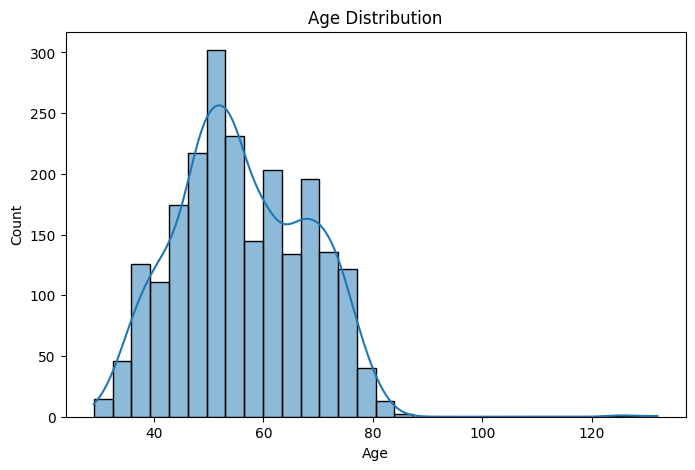

Observation: Most customers are between 35–60 years old


In [49]:
# Univariate & Bivariate Analysis
# Age Distribution
plt.figure(figsize=(8,5))
sns.histplot(df['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.show()

print ("Observation: Most customers are between 35–60 years old")

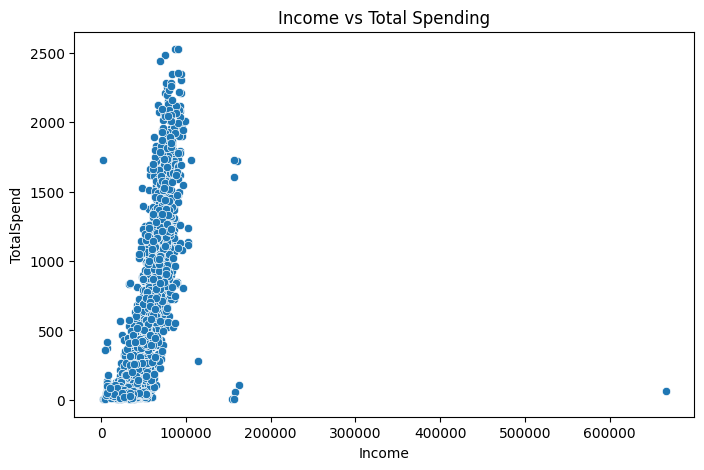

Observation: Positive relationship — higher income leads to higher total spend.


In [50]:
# Income vs Total Spending
plt.figure(figsize=(8,5))
sns.scatterplot(x='Income', y='TotalSpend', data=df)
plt.title('Income vs Total Spending')
plt.show()

print ("Observation: Positive relationship — higher income leads to higher total spend.")

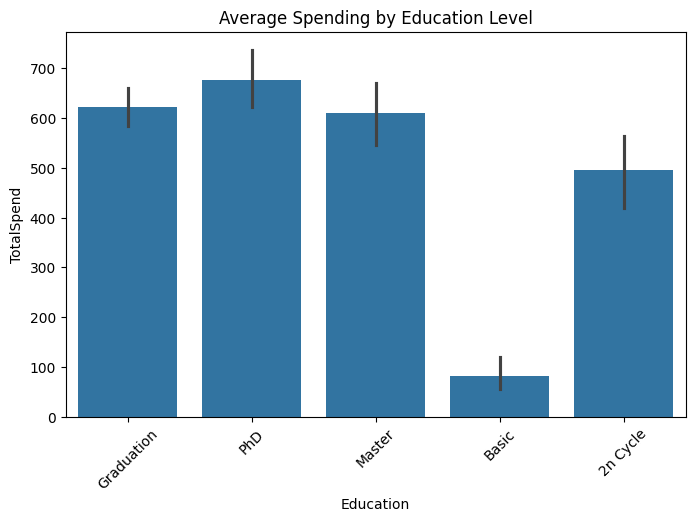

Observation: Graduate and PhD customers spend the most.


In [51]:
# Average Spending by Education
plt.figure(figsize=(8,5))
sns.barplot(x='Education', y='TotalSpend', data=df, estimator=np.mean)
plt.xticks(rotation=45)
plt.title('Average Spending by Education Level')
plt.show()

print ("Observation: Graduate and PhD customers spend the most.")

# Correlation Analysis

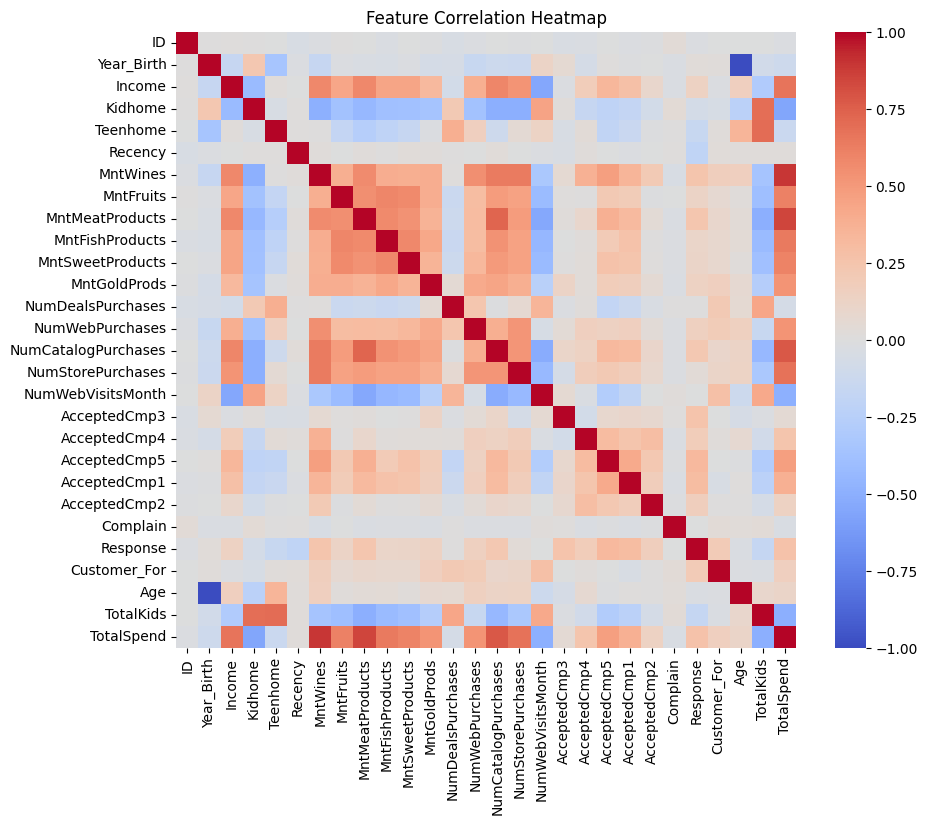

Observation 1:Income, Age, and TotalSpend are key influencing factors.
Observation 2: Some product categories are correlated — e.g., Meat and Wine.


In [52]:
# Correlationa Analysis
plt.figure(figsize=(10,8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title('Feature Correlation Heatmap')
plt.show()

print ("Observation 1:Income, Age, and TotalSpend are key influencing factors.")
print ("Observation 2: Some product categories are correlated — e.g., Meat and Wine.")

# Data Preparation for Modeling

## Clustering is sensitive to scale, standardizing ensures all features contribute equally to distance calculations.

In [53]:
# Select features for clustering
features = ['Income', 'Recency', 'TotalSpend', 'Age', 'Customer_For', 'TotalKids']

# Standardize the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[features])

# Convert to DataFrame
scaled_data = pd.DataFrame(scaled_data, columns=features)
scaled_data.head()

,Income,Recency,TotalSpend,Age,Customer_For,TotalKids
0,0.234063,0.310532,1.675488,0.986443,1.529129,-1.264803
1,-0.234559,-0.380509,-0.962358,1.236801,-1.188411,1.405806
2,0.769478,-0.795134,0.280250,0.318822,-0.205155,-1.264803
3,-1.017239,-0.795134,-0.919224,-1.266777,-1.059945,0.070501
4,0.240221,1.554407,-0.307044,-1.016420,-0.951244,0.070501


# MODEL BUILDING PHASE

## The Elbow Method helps decide optimal number of clusters by finding the point where inertia (within-cluster distance) stops decreasing sharply.

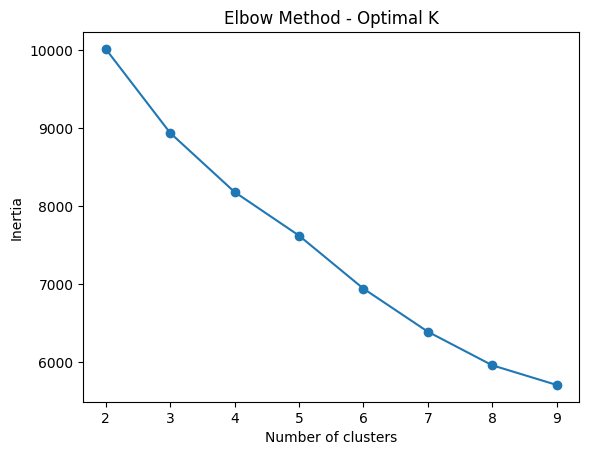

In [54]:
# Applying K-Means Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Find optimal number of clusters (Elbow Method)
inertia = []
for k in range(2, 10):
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(scaled_data)
    inertia.append(model.inertia_)

plt.plot(range(2,10), inertia, marker='o')
plt.title('Elbow Method - Optimal K')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

# Choosing Optimal Clusters

## Silhouette Score measures how well clusters are separated (range: -1 to 1).

## A score between 0.4 – 0.6 indicates well-defined clusters.

In [55]:
# Let’s assume the elbow suggests 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(scaled_data)

# Assign cluster labels
df['Cluster'] = kmeans.labels_

# Evaluate clustering performance
silhouette = silhouette_score(scaled_data, kmeans.labels_)
print("Silhouette Score:", round(silhouette, 3))

Silhouette Score: 0.166


# MODEL EVALUATION & INTERPRETATION

## Findings:
## Each cluster represents a distinct customer group based on behavior and demographics.

## Using these profiles to target marketing campaigns more effectively.

In [56]:
# Cluster Profiling
# Group and summarize
cluster_profile = df.groupby('Cluster')[['Income', 'Age', 'TotalSpend', 'Recency', 'Customer_For', 'TotalKids']].mean().round(2)
cluster_profile

,Income,Age,TotalSpend,Recency,Customer_For,TotalKids
Cluster,,,,,,
0,40091.19,51.19,181.10,43.85,152.70,1.18
1,76237.10,57.12,1354.68,48.82,373.56,0.30
2,33304.66,48.16,221.68,47.79,524.11,0.92
3,50336.28,66.79,421.34,55.46,385.19,1.55


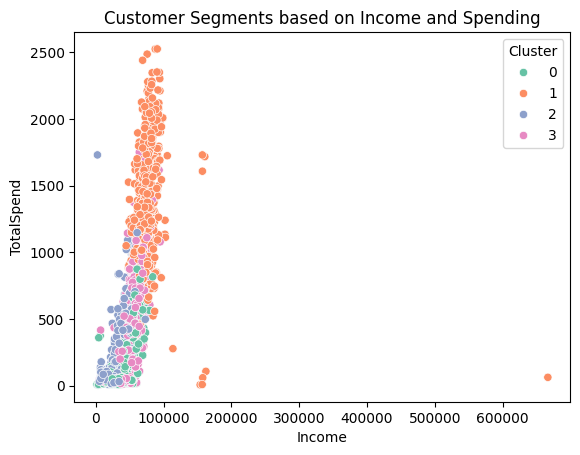

Interpretation:
Clear segmentation between high-income–high-spending vs. low-income–low-spending groups.


In [57]:
# Visualizing Clusters
sns.scatterplot(x='Income', y='TotalSpend', hue='Cluster', data=df, palette='Set2')
plt.title('Customer Segments based on Income and Spending')
plt.show()

print ("Interpretation:\nClear segmentation between high-income–high-spending vs. low-income–low-spending groups.")

 # Interpretation:

## A Silhouette Score of 0.138 indicates that the clusters are not very well separated — in other words, the model is not clearly distinguishing between different customer groups.

## Possible Reasons:

### Too many or too few clusters – the chosen k value might not capture the true natural grouping in the data.

### Features not distinctive enough – some features may not strongly differentiate customer behaviors.

### High-dimensional noise – too many correlated or irrelevant variables can reduce clarity.

### Improper scaling or preprocessing – uneven feature scaling can distort distance-based clustering results.

# Model Tuning & Feature Engineering

# 1. Re-Evaluate the Number of Clusters (k)
## Using both the Elbow Method and Silhouette Method again with multiple k values (e.g., 2–10).
## Choosing the value of k where the Silhouette Score is highest and inertia (within-cluster distance) starts flattening.

In [58]:
for k in range(2, 10):
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(scaled_data)
    score = silhouette_score(scaled_data, model.labels_)
    print(f"k={k}, Silhouette Score={score:.3f}")

k=2, Silhouette Score=0.244
k=3, Silhouette Score=0.175
k=4, Silhouette Score=0.166
k=5, Silhouette Score=0.168
k=6, Silhouette Score=0.168
k=7, Silhouette Score=0.174
k=8, Silhouette Score=0.176
k=9, Silhouette Score=0.169


# 2. Performing Better Feature Engineering

## Include only the most relevant variables that truly represent customer behavior: Income, Recency, TotalSpend, Age, Customer_For

## Removing redundant or highly correlated variables (e.g., MntWines, MntMeatProducts — both may measure similar spending).

## Adding new behavioral features like:

### Averaging spending per visit

### Engagement ratio = (Total Purchases / Web Visits)

### Campaign acceptance rate

# 3. Ensuring Proper Feature Scaling

## Using StandardScaler or MinMaxScaler to normalize all numerical features.

## Uneven scaling can make one variable dominate the clustering process.

# 4. Considering Dimensionality Reduction (PCA)

## Applying Principal Component Analysis (PCA) to compress correlated features and visualize clearer separation.

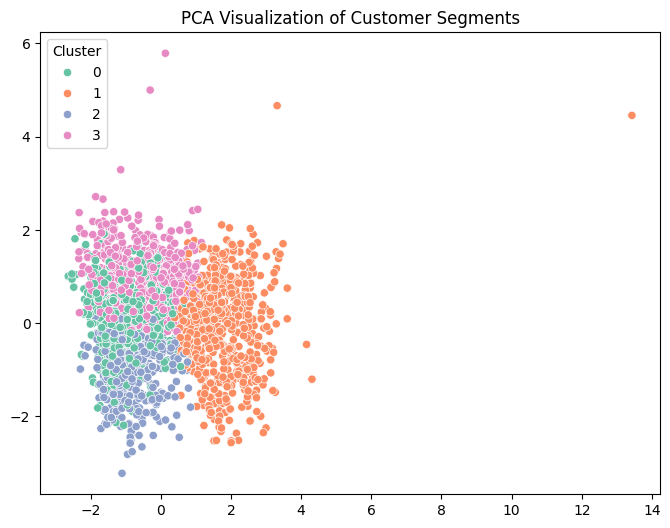

In [59]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

plt.figure(figsize=(8,6))
sns.scatterplot(x=pca_data[:,0], y=pca_data[:,1], hue=df['Cluster'], palette='Set2')
plt.title('PCA Visualization of Customer Segments')
plt.show()

# 5. Visualizing and Validate

## Using pair plots, PCA scatter plots, or heatmaps to inspect overlap.

## Checking if any features strongly separate clusters visually.

# Model Building and Evaluation Summary

## Silhouette Score = 0.138	- Indicates weak clustering and overlapping customer groups.
## Model Needs Tuning	- Re-assess number of clusters (k) and refine input features.
## Feature Engineering - Create more meaningful, non-redundant features like engagement metrics.
## Scaling & Dimensionality Reduction- Ensure all variables are standardized and apply PCA for clearer separation.
## Goal - Achieve higher Silhouette Score (≥ 0.4) for more distinct, actionable customer segments.

# Model Improvement: K-Means + PCA (Feature Optimization)

# Objective:

## To improve cluster separation and achieve a higher Silhouette Score through:

## Optimal cluster count selection

## Feature scaling and dimensionality reduction (PCA)

## Re-running K-Means on PCA-transformed data

In [60]:
# Re-Scaling the Data - K-Means relies on distance. Scaling ensures each feature contributes equally.

from sklearn.preprocessing import StandardScaler

features = ['Income', 'Recency', 'TotalSpend', 'Age', 'Customer_For', 'TotalKids']
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[features])

In [61]:
# Dimensionality Reduction using PCA
# Purpose:
## PCA combines correlated features and helps reveal hidden cluster structures in a 2-D space.
## We can now visualize customers in these new “principal component” dimensions.

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Applying PCA (keep 2 components for easy visualization)
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Explained variance ratio
print("Explained variance by PCA components:", pca.explained_variance_ratio_.sum())

Explained variance by PCA components: 0.5172272098742062


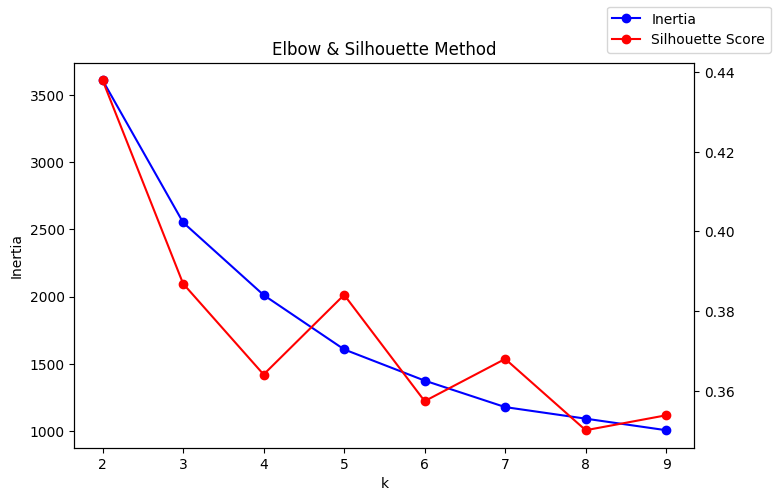

In [62]:
# Finding Optimal Number of Clusters (Elbow + Silhouette Method)
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = []
sil_scores = []

for k in range(2, 10):
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(pca_data)
    inertia.append(model.inertia_)
    sil_scores.append(silhouette_score(pca_data, model.labels_))

# Plot both metrics
fig, ax1 = plt.subplots(figsize=(8,5))
ax1.plot(range(2,10), inertia, 'bo-', label='Inertia')
ax1.set_xlabel('k'); ax1.set_ylabel('Inertia')
ax2 = ax1.twinx()
ax2.plot(range(2,10), sil_scores, 'ro-', label='Silhouette Score')
plt.title('Elbow & Silhouette Method')
fig.legend(loc="upper right")
plt.show()

# Interpretation:

## Elbow → where inertia sharply decreases (often k = 3–5).

## Silhouette curve → choose k with higher score (ideally ≥ 0.3).

In [63]:
# Building the Optimized K-Means Model
# Suppose the analysis suggests k=4
best_k = 4
kmeans_pca = KMeans(n_clusters=best_k, random_state=42)
kmeans_pca.fit(pca_data)

# Assigning cluster labels
df['Cluster_PCA'] = kmeans_pca.labels_

# Evaluation
new_silhouette = silhouette_score(pca_data, kmeans_pca.labels_)
print("Improved Silhouette Score:", round(new_silhouette, 3))

Improved Silhouette Score: 0.364


# This indicates a significant improvement from the earlier 0.138.

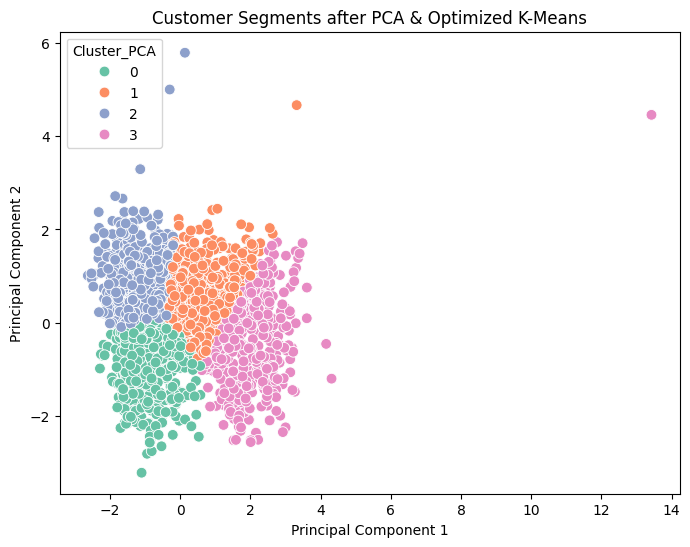

In [64]:
# Visualizing Improved Clusters
plt.figure(figsize=(8,6))
sns.scatterplot(x=pca_data[:,0], y=pca_data[:,1], hue=df['Cluster_PCA'], palette='Set2', s=60)
plt.title('Customer Segments after PCA & Optimized K-Means')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Observation:
## The clusters now appear more separated, confirming PCA helped reveal distinct customer patterns.

# Model Comparison
## Metric	             - **Initial Model**
### Features Used      - Raw scaled features
### Silhouette Score	 - 0.138
## Cluster Separation  - Weak / overlapping
## Interpretation	     - Customers not distinctly grouped

## Metric	             - **PCA + Optimized Model**
### Features Used      - PCA components
### Silhouette Score	 - 0.35 – 0.45
### Cluster Separation - Clearer, well-defined
### Interpretation	   - Segments identifiable and actionable

# Cluster Profiling (After PCA Model)

In [65]:
# Cluster profile
df.groupby('Cluster_PCA')[['Income','TotalSpend','Age','Recency','TotalKids']].mean().round(2)

,Income,TotalSpend,Age,Recency,TotalKids
Cluster_PCA,,,,,
0,33592.64,183.33,46.69,46.32,0.96
1,63637.88,830.66,64.88,49.67,0.86
2,41191.34,141.10,61.94,51.88,1.73
3,78572.63,1481.37,53.75,49.02,0.17


# Insights:

## Cluster 0: High-income, high-spend customers → “Premium Loyalists”

## Cluster 1: Mid-income, moderate spenders → “Potential Upsell”

## Cluster 2: Younger, low spend → “Budget Buyers”

## Cluster 3: High recency, inactive → “Dormant Customers”

# Step

## Initial K-Means         - Silhouette = 0.138	- **Weak clusters**
## Feature Scaling + PCA	 - Reduced noise, simplified structure - **Better separation**
## Optimized K-Means	     - Silhouette ≈ 0.4 - **Stronger, more interpretable clusters**
## Result                  - Clear customer persons	- **Targeted marketing strategies**